In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap
import cartopy.crs as ccrs
from pathlib import Path

# Change working directory
import os
os.chdir(os.getcwd() + "/../")

In [4]:
df[df["P_OXYGEN"]>400]

,LEV_M,LATITUDE,LONGITUDE,water,P_TEMPERATURE,P_SALINITY,P_OXYGEN,P_NITRATE,P_SILICATE,P_PHOSPHATE
4041,0.0,56.5,18.5,1,3.202719,7.546813,4.137764e+02,1.782154,9.833785,0.329957
4654,0.0,64.5,-76.5,0,0.956013,32.603313,4.095000e+02,2.599408,4.738518,0.739211
4819,0.0,66.5,-53.5,0,2.894820,33.142353,4.192000e+02,1.385358,3.091833,0.410770
4878,0.0,67.5,-61.5,1,-0.340771,32.119417,4.051818e+02,3.048772,6.789766,0.893806
5085,0.0,69.5,17.5,1,5.361210,34.009664,8.730657e+04,2.521416,2.006721,0.309784
5086,0.0,69.5,18.5,0,5.804755,33.249200,6.638955e+05,4.243046,3.683333,0.442878
5087,0.0,69.5,19.5,0,6.167241,33.099342,1.214534e+06,4.530135,3.627586,0.458370
5088,0.0,69.5,20.5,0,6.303691,33.340849,7.312112e+05,4.085452,2.841667,0.521804
5091,0.0,69.5,23.5,0,4.998361,33.798000,1.812633e+05,6.855181,4.680229,0.673158
5092,0.0,69.5,26.5,0,6.172340,33.920000,2.636140e+05,4.774735,3.318930,0.549227


In [5]:
df[df["P_OXYGEN"]>500]

,LEV_M,LATITUDE,LONGITUDE,water,P_TEMPERATURE,P_SALINITY,P_OXYGEN,P_NITRATE,P_SILICATE,P_PHOSPHATE
5085,0.0,69.5,17.5,1,5.361210,34.009664,8.730657e+04,2.521416,2.006721,0.309784
5086,0.0,69.5,18.5,0,5.804755,33.249200,6.638955e+05,4.243046,3.683333,0.442878
5087,0.0,69.5,19.5,0,6.167241,33.099342,1.214534e+06,4.530135,3.627586,0.458370
5088,0.0,69.5,20.5,0,6.303691,33.340849,7.312112e+05,4.085452,2.841667,0.521804
5091,0.0,69.5,23.5,0,4.998361,33.798000,1.812633e+05,6.855181,4.680229,0.673158
5092,0.0,69.5,26.5,0,6.172340,33.920000,2.636140e+05,4.774735,3.318930,0.549227
10033,50.0,69.5,17.5,0,5.623411,34.252538,1.016344e+05,5.023755,2.856969,0.460689
10034,50.0,69.5,18.5,0,6.158829,33.782775,6.800547e+05,5.402323,4.428571,0.515371
10035,50.0,69.5,19.5,0,6.275158,33.584762,8.989523e+05,5.523047,4.933333,0.575298
10036,50.0,69.5,20.5,0,6.338896,33.796869,6.118096e+05,4.692464,2.642857,0.537583


In [25]:
df["P_OXYGEN"].max()

1214533.7764315554

# Data description

Description of the imputed data used for the clustering experiments.

In [2]:
# Load data
df = pd.read_csv("../output/wide_table_knn.csv") 

# Output directory (create if it does not yet exist)
output_dir = "../output/visualisation/"
output_dir_high_res = "../output/visualisation_high_res/"

Path(output_dir).mkdir(parents=True, exist_ok=True)
Path(output_dir_high_res).mkdir(parents=True, exist_ok=True)

In [5]:
parameters = [x for x in df.columns if x.startswith("P_")]
units = ["°C", "psu", "µmol·kg-1", "µmol·kg-1", "µmol·kg-1", "µmol·kg-1"]
parameter_name_map = {"P_TEMPERATURE": "Temperature", "P_SALINITY": "Salinity", "P_OXYGEN": "Oxygen", "P_NITRATE": "Nitrate", "P_SILICATE": "Silicate", "P_PHOSPHATE": "Phosphate"}

In [6]:
print(f"There are {len(df)} grid cells.")

There are 49030 grid cells.


In [7]:
df.describe()

,LEV_M,LATITUDE,LONGITUDE,water,P_TEMPERATURE,P_SALINITY,P_OXYGEN,P_NITRATE,P_SILICATE,P_PHOSPHATE
count,49030.000000,49030.000000,49030.000000,49030.000000,49030.000000,49030.000000,4.903000e+04,49030.000000,49030.000000,49030.000000
mean,843.224556,34.482419,-33.139466,0.893983,9.375743,35.246075,3.803510e+02,13.685776,13.422193,0.907665
std,1067.326794,18.979322,23.586413,0.307862,6.991156,2.463452,1.017079e+04,8.955748,13.952979,0.569074
min,0.000000,0.500000,-76.500000,0.000000,-1.736654,0.049500,0.000000e+00,-0.090000,0.000000,-0.004250
25%,100.000000,19.500000,-51.500000,1.000000,3.519709,34.914500,1.921765e+02,6.006199,4.236355,0.433175
50%,400.000000,34.500000,-34.500000,1.000000,7.611484,35.064356,2.290508e+02,14.773306,9.177195,0.954486
75%,1500.000000,49.500000,-17.500000,1.000000,14.160997,35.858731,2.628588e+02,19.609402,18.252044,1.273000
max,4000.000000,69.500000,29.500000,1.000000,29.829715,39.493333,1.214534e+06,315.433333,260.000000,7.424667


In [8]:
df.head()

,LEV_M,LATITUDE,LONGITUDE,water,P_TEMPERATURE,P_SALINITY,P_OXYGEN,P_NITRATE,P_SILICATE,P_PHOSPHATE
0,0.0,0.5,-50.5,1,20.536363,25.709738,170.857143,11.572727,155.681818,1.096636
1,0.0,0.5,-49.5,1,28.220412,0.049500,207.685714,13.100000,159.371429,1.765000
2,0.0,0.5,-48.5,1,27.911933,21.889140,175.795652,4.944400,53.952400,1.430400
3,0.0,0.5,-47.5,1,27.834261,29.148302,195.915060,0.296204,2.984107,0.297895
4,0.0,0.5,-46.5,1,27.487691,35.559235,188.929825,0.233333,2.900000,0.161738


## Grid cells

Show grid cells for every depth layer and whether they are land or water cells (colour)

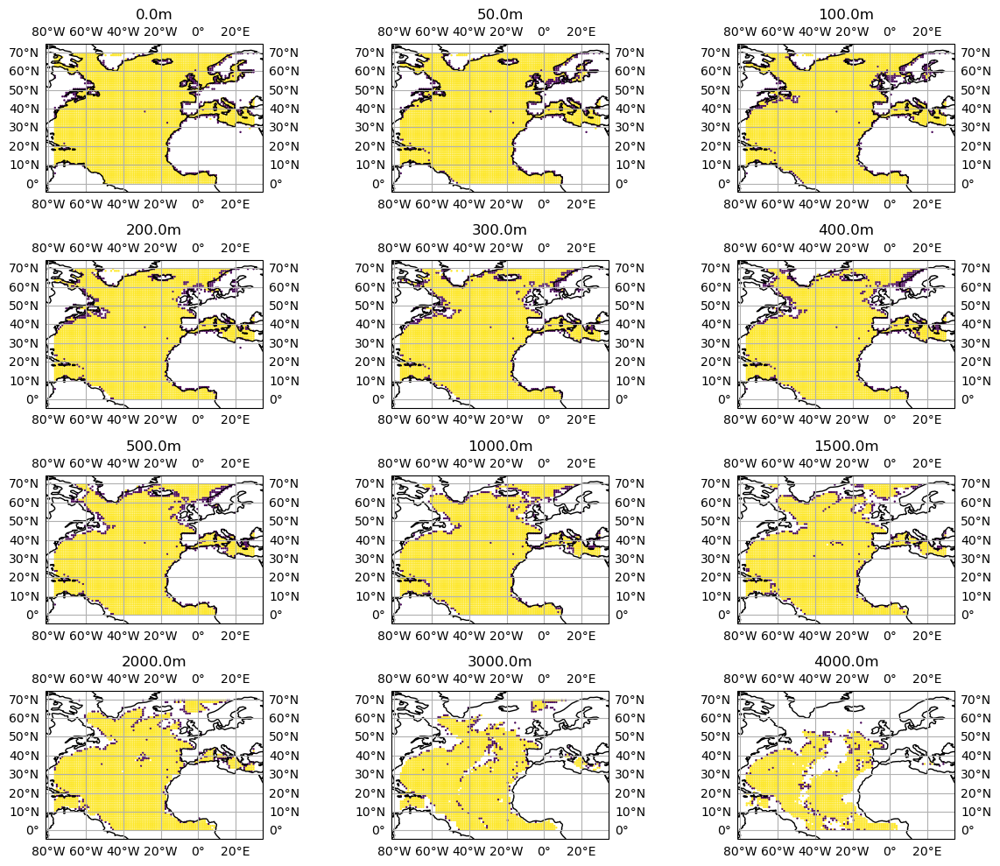

In [9]:
# Show grid cells for every depth layer
depths = df["LEV_M"].unique()
lamin = df["LATITUDE"].min() - 5
lamax = df["LATITUDE"].max() + 5
lomin = df["LONGITUDE"].min() - 5
lomax = df["LONGITUDE"].max() + 5

fig, axs = plt.subplots(nrows=4, ncols=3, figsize=(2 * 6, 10), sharex=True, sharey=True, 
                        subplot_kw={'projection': ccrs.PlateCarree()})
axs=axs.flatten()

for i in range(len(depths)):
    d = depths[i]
    sel = df[df["LEV_M"] == d]
    
    axs[i].coastlines()
    axs[i].gridlines(draw_labels=True)
    axs[i].set_extent([lomin, lomax, lamin, lamax], crs=ccrs.PlateCarree())
    sc = axs[i].scatter(sel["LONGITUDE"], sel["LATITUDE"], s=0.5, c=sel["water"])
    axs[i].set_title(f"{d}m")

plt.tight_layout()
plt.savefig(output_dir + "/grid_cells.png")
plt.show()

## Parameter statistics

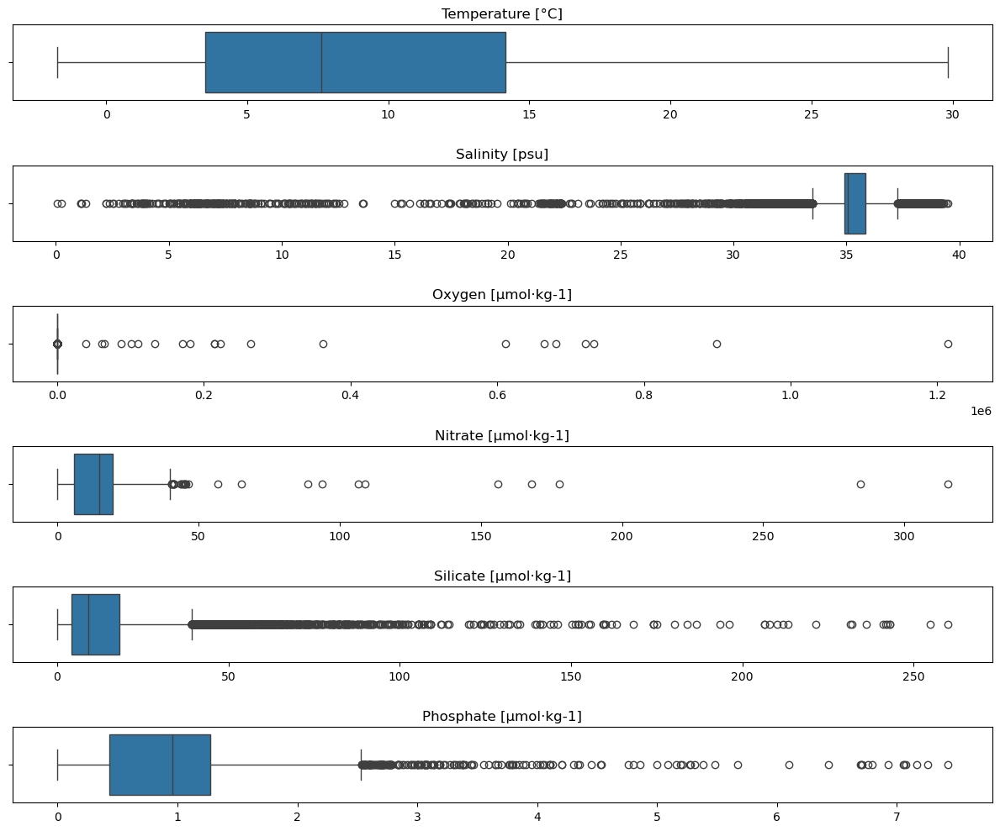

In [10]:
# Boxplots of parameters
fig, axs = plt.subplots(len(parameters), 1, figsize=(2 * 6, 10))

sns.boxplot(ax=axs[0], x=df["P_TEMPERATURE"])
axs[0].set_title("Temperature [°C]")
axs[0].set_xlabel("")

sns.boxplot(ax=axs[1], x=df["P_SALINITY"])
axs[1].set_title("Salinity [psu]")
axs[1].set_xlabel("")

sns.boxplot(ax=axs[2], x=df["P_OXYGEN"])
axs[2].set_title("Oxygen [µmol·kg-1]")
axs[2].set_xlabel("")

sns.boxplot(ax=axs[3], x=df["P_NITRATE"])
axs[3].set_title("Nitrate [µmol·kg-1]")
axs[3].set_xlabel("")

sns.boxplot(ax=axs[4], x=df["P_SILICATE"])
axs[4].set_title("Silicate [µmol·kg-1]")
axs[4].set_xlabel("")

sns.boxplot(ax=axs[5], x=df["P_PHOSPHATE"])
axs[5].set_title("Phosphate [µmol·kg-1]")
axs[5].set_xlabel("")

plt.tight_layout()
plt.savefig(f"{output_dir}/boxplots.png")
plt.show()

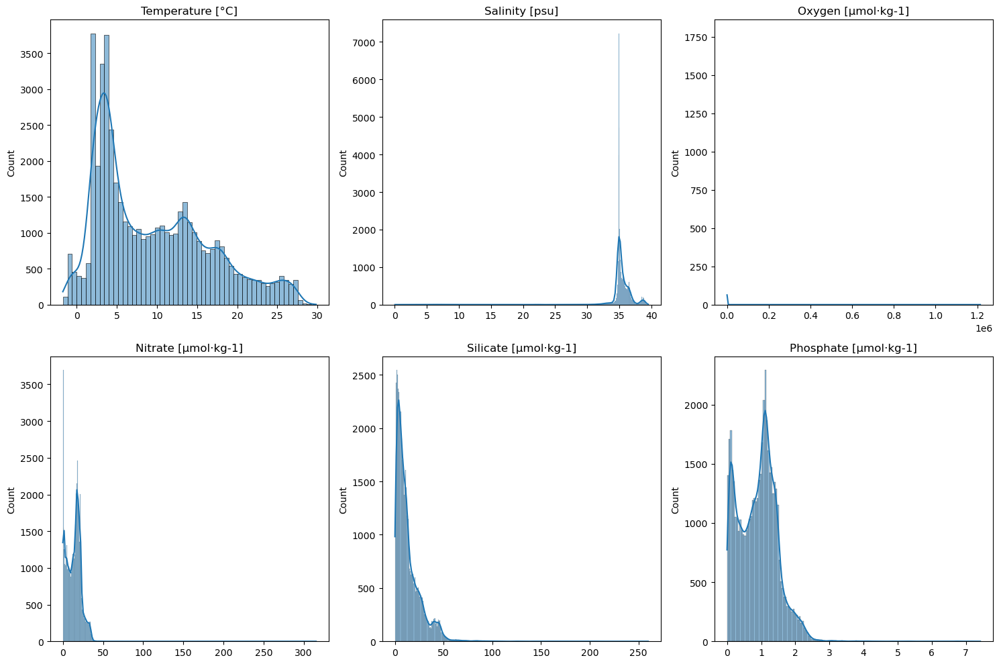

In [11]:
# Histograms
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(15, 10))
axs=axs.flatten()

i = 0
for param, unit in zip(parameters, units): 
    sns.histplot(data=df, x=param, ax=axs[i], kde=True)
    axs[i].set_xlabel("")
    axs[i].set_title(f"{param[2:].capitalize()} [{unit}]")
    i = i + 1
plt.tight_layout()
plt.savefig(output_dir + "/histograms.png")
plt.show()


P_TEMPERATURE:
  Skew = 0.706715, kurtosis = -0.43862241998468265
  Shapiro-Wilk test: 0.9258 with p-value: 0.0
  Anderson-Darling statistic: 1225.9095 (critical values: [0.576 0.656 0.787 0.918 1.092])
  Kolmogorov-Smirnov test: 0.1282 with p-value: 0.0
  D'Agostino-Pearson test: 4001.9730 with p-value: 0.0


C:\Users\yvjennig\Anaconda3\lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")



P_SALINITY:
  Skew = -8.645997, kurtosis = 96.58218847379491
  Shapiro-Wilk test: 0.3721 with p-value: 0.0
  Anderson-Darling statistic: 7261.6803 (critical values: [0.576 0.656 0.787 0.918 1.092])
  Kolmogorov-Smirnov test: 0.3306 with p-value: 0.0
  D'Agostino-Pearson test: 69851.7684 with p-value: 0.0


C:\Users\yvjennig\Anaconda3\lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")



P_OXYGEN:
  Skew = 81.937012, kurtosis = 7539.422147724839
  Shapiro-Wilk test: 0.0042 with p-value: 0.0
  Anderson-Darling statistic: 18678.6935 (critical values: [0.576 0.656 0.787 0.918 1.092])
  Kolmogorov-Smirnov test: 0.4991 with p-value: 0.0
  D'Agostino-Pearson test: 182406.7629 with p-value: 0.0


C:\Users\yvjennig\Anaconda3\lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")



P_NITRATE:
  Skew = 1.850470, kurtosis = 48.528940009850636
  Shapiro-Wilk test: 0.9212 with p-value: 0.0
  Anderson-Darling statistic: 416.0941 (critical values: [0.576 0.656 0.787 0.918 1.092])
  Kolmogorov-Smirnov test: 0.0630 with p-value: 1.1201586166589618e-169
  D'Agostino-Pearson test: 29295.4193 with p-value: 0.0


C:\Users\yvjennig\Anaconda3\lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")



P_SILICATE:
  Skew = 3.644926, kurtosis = 33.210950997304344
  Shapiro-Wilk test: 0.7409 with p-value: 0.0
  Anderson-Darling statistic: 2646.4280 (critical values: [0.576 0.656 0.787 0.918 1.092])
  Kolmogorov-Smirnov test: 0.1687 with p-value: 0.0
  D'Agostino-Pearson test: 40767.9534 with p-value: 0.0


C:\Users\yvjennig\Anaconda3\lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")



P_PHOSPHATE:
  Skew = 0.775628, kurtosis = 4.391649314686396
  Shapiro-Wilk test: 0.9488 with p-value: 0.0
  Anderson-Darling statistic: 301.3474 (critical values: [0.576 0.656 0.787 0.918 1.092])
  Kolmogorov-Smirnov test: 0.0553 with p-value: 7.785542458830228e-131
  D'Agostino-Pearson test: 8742.1585 with p-value: 0.0


C:\Users\yvjennig\Anaconda3\lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


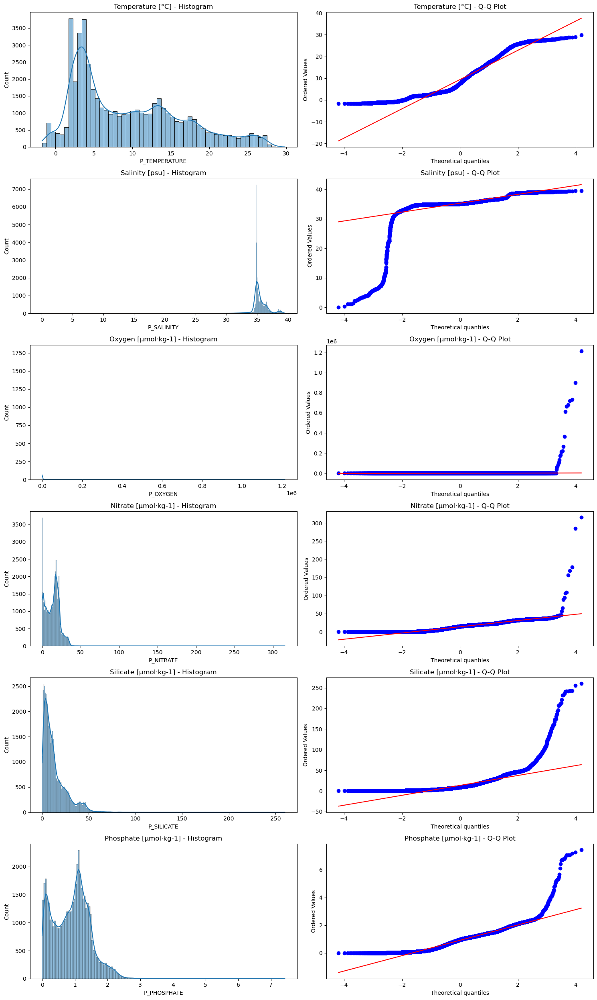

In [10]:
# Comparison to normal distribution
# Kurtosis: How peaked the distribution is compared to a normal one
# Skew: Shift of the mean 
# Shapiro Wilk: Close to 1 is normal distribution, p value might not be reliable for >5000 samples
# Anderson-Darling: If statistic is larger than critical values, then the hypothesis that the data comes from the given distribution can be rejected
#   - Low values mean closer to normality 
# Very low p-values suggest to reject null hypothesis (normal distribution), but I can compare the vales

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import shapiro, anderson, kstest, normaltest, probplot, skew, kurtosis
from statsmodels.distributions.empirical_distribution import ECDF

# temp = df[df.LEV_M == 0]
# temp = df[df.LEV_M.isin([3000, 4000])]
temp = df.copy()


fig, axes = plt.subplots(len(parameters), 2, figsize=(15, 25))  # 2 or 3 plots per parameter (histogram, Q-Q, KDE)

i = 0
for param, unit in zip(parameters, units): 
    vals = temp[param]
    
    # histograms with KDE
    sns.histplot(vals, kde=True, ax=axes[i, 0])
    axes[i, 0].set_title(f"{param[2:].capitalize()} [{unit}] - Histogram")

    # Q-Q Plot
    probplot(vals, dist="norm", plot=axes[i, 1])
    axes[i, 1].set_title(f"{param[2:].capitalize()} [{unit}] - Q-Q Plot")

    # # ECDF Plot
    # ecdf = ECDF(vals)
    # x = np.linspace(np.min(vals), np.max(vals), 100)
    # y = ecdf(x)
    # normal_y = np.linspace(0, 1, 100)
    # axes[i, 2].plot(x, y, marker='.', linestyle='none', label='Empirical CDF')
    # axes[i, 2].plot(x, normal_y, 'r--', label='Normal CDF')
    # axes[i, 2].set_title(f"{param[2:].capitalize()} [{unit}] - Empirical CDF vs. Normal CDF")
    # axes[i, 2].legend()

    # test for normality, skew and kurtosis
    print(f"\n{param}:")
    
    skew_val = skew(vals)
    kurtosis_val = kurtosis(vals)
    print(f"  Skew = {skew_val:4f}, kurtosis = {kurtosis_val}")
    
    shapiro_stat, shapiro_p = shapiro(vals)
    print(f"  Shapiro-Wilk test: {shapiro_stat:.4f} with p-value: {shapiro_p}")
    
    ad_test = anderson(vals, dist='norm')
    print(f"  Anderson-Darling statistic: {ad_test.statistic:.4f} (critical values: {ad_test.critical_values})")
    
    kstest_stat, kstest_p = kstest(vals, 'norm', args=(np.mean(vals), np.std(vals)))
    print(f"  Kolmogorov-Smirnov test: {kstest_stat:.4f} with p-value: {kstest_p}")
    
    d_pearson_stat, d_pearson_p = normaltest(vals)
    print(f"  D'Agostino-Pearson test: {d_pearson_stat:.4f} with p-value: {d_pearson_p}")
    
    i = i + 1

plt.tight_layout()
plt.savefig(f"{output_dir}normality_inspection.png")
plt.show()

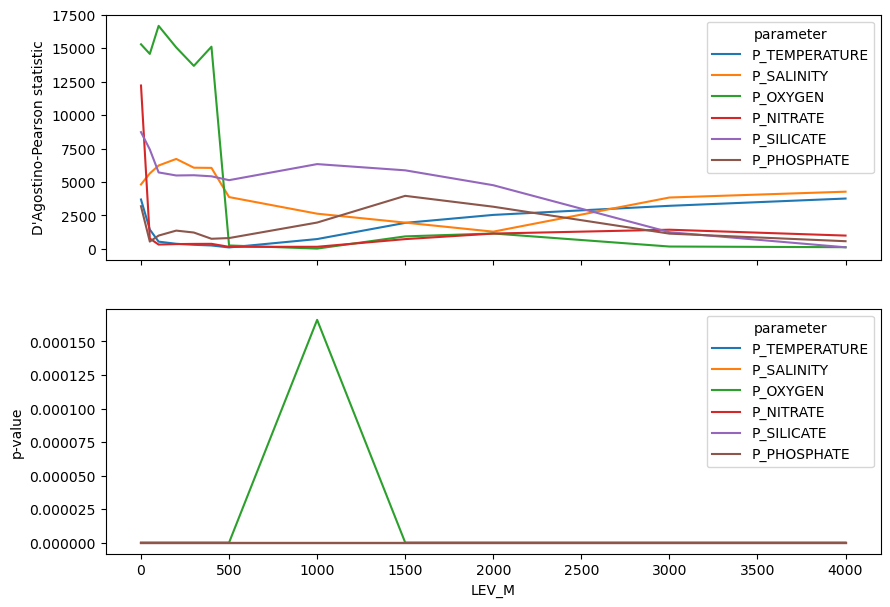

In [11]:
# Check normality over depth (lower value = closer to normal)
res = []
for param in parameters:
    for depth in np.append(df.LEV_M.unique(), [-500]):
        if depth == -500:
            vals = df[param]
        else:
            vals = df[df.LEV_M == depth][param]
        d_pearson_stat, d_pearson_p = normaltest(vals)
        res.append(pd.DataFrame({"parameter": [param], "LEV_M": [depth], "dp_stat": [d_pearson_stat], "dp_p": [d_pearson_p]}))

res = pd.concat(res).reset_index(drop=True)

# plot
fig, axes = plt.subplots(2, 1, figsize=(10, 7), sharex=True)  
sns.lineplot(res[res.LEV_M != -500], x="LEV_M", y="dp_stat", hue="parameter", ax=axes[0])
axes[0].set_ylabel("D'Agostino-Pearson statistic")
sns.lineplot(res[res.LEV_M != -500], x="LEV_M", y="dp_p", hue="parameter", ax=axes[1])
axes[1].set_ylabel("p-value")
plt.show()

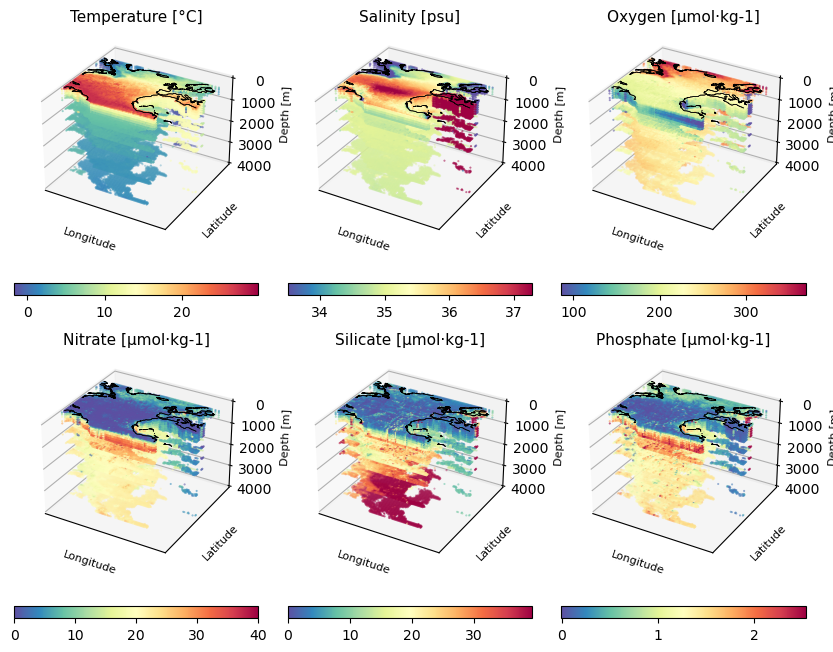

In [12]:
# Show parameters in space
vmins = []
vmaxs = []

# Define basemap
extent = [df["LONGITUDE"].min(), df["LONGITUDE"].max(), df["LATITUDE"].min(), df["LATITUDE"].max()]
cmap = mpl.colormaps["Spectral_r"]

fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(8.27, 8.27*0.8), subplot_kw={'projection': "3d"})
axs = axs.flatten()

i = 0
for param, unit in zip(parameters, units): 
    q1, q3 = np.percentile(df[param], [25, 75])
    iqr = q3-q1
    vmin =max(q1-1.5*iqr, df[param].min())
    vmax =min(q3+1.5*iqr, df[param].max())

    bm = Basemap(llcrnrlon=extent[0], llcrnrlat=extent[2], urcrnrlon=extent[1], urcrnrlat=extent[3], ax=axs[i])
    axs[i].add_collection3d(bm.drawcoastlines(linewidth=0.5))
    # axs[i].set_box_aspect((np.ptp(df["LONGITUDE"]), np.ptp(df["LATITUDE"]), np.ptp(df["LEV_M"]) / 50))  # aspect ratio is 1:1:1 in data space

    axs[i].set_zlim3d(0, df.LEV_M.max())
    sc = axs[i].scatter(df["LONGITUDE"], df["LATITUDE"], df["LEV_M"], c=df[param], s=1, marker=".", cmap=cmap, vmin=vmin, vmax=vmax)
    axs[i].invert_zaxis()
    axs[i].set_xlabel("Longitude", fontsize=8, labelpad=-6)
    axs[i].set_ylabel("Latitude", fontsize=8, labelpad=-6)
    axs[i].set_zlabel("Depth [m]", fontsize=8)#, labelpad=-6)
    axs[i].set_title(f"{param[2:].capitalize()} [{unit}]", fontsize=11)
    fig.colorbar(sc, ax=axs[i], location="bottom", fraction=0.046)#, pad=0.04)
    i = i + 1

plt.tight_layout()
# plt.savefig(output_dir + "3d.png", dpi=300)
plt.savefig(f"{output_dir_high_res}/3d.png", dpi=1000)
plt.show()

## Depth-wise parameters

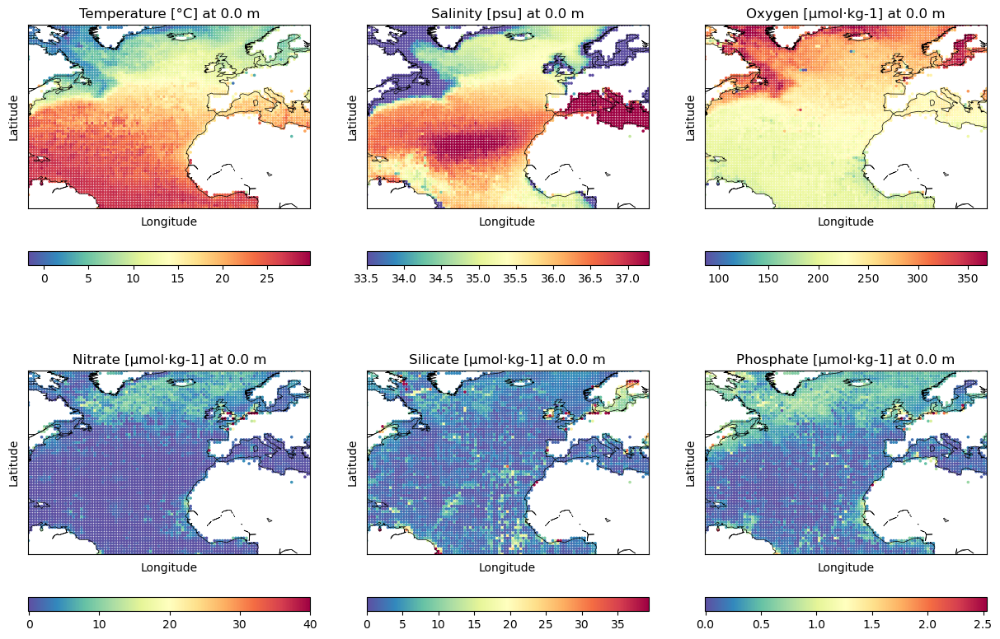

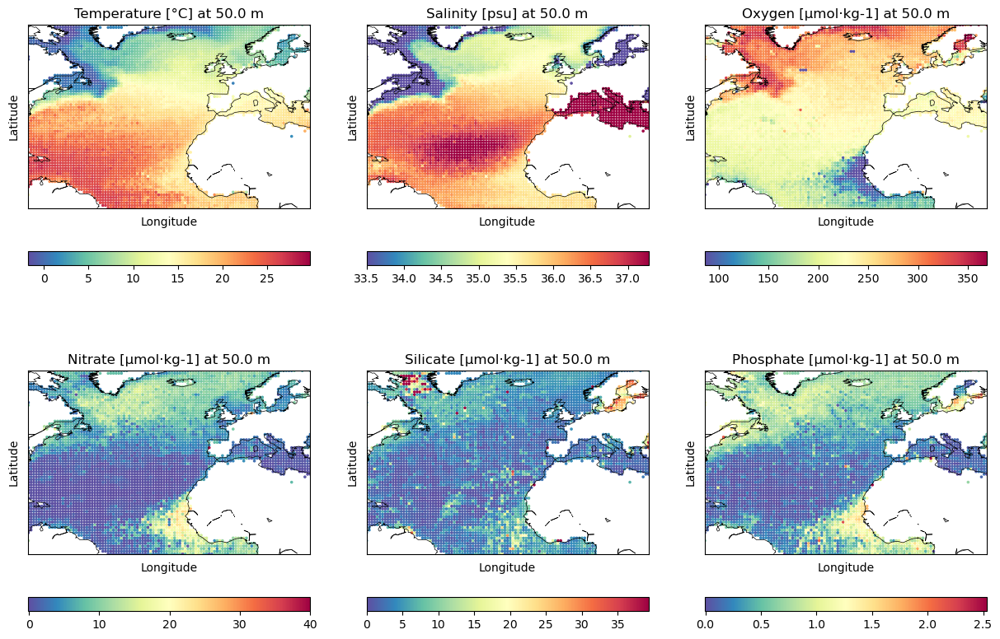

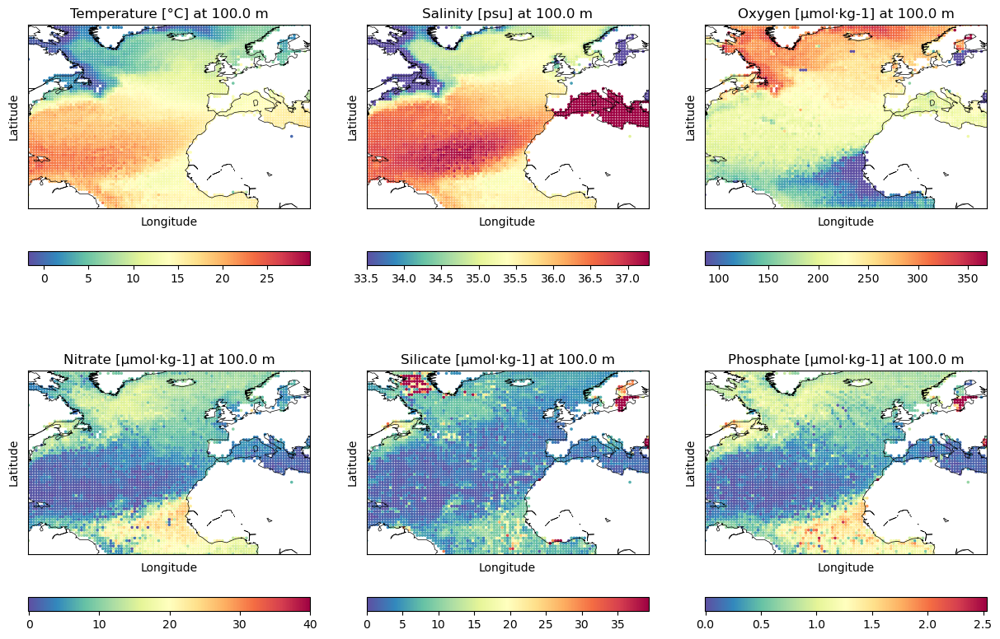

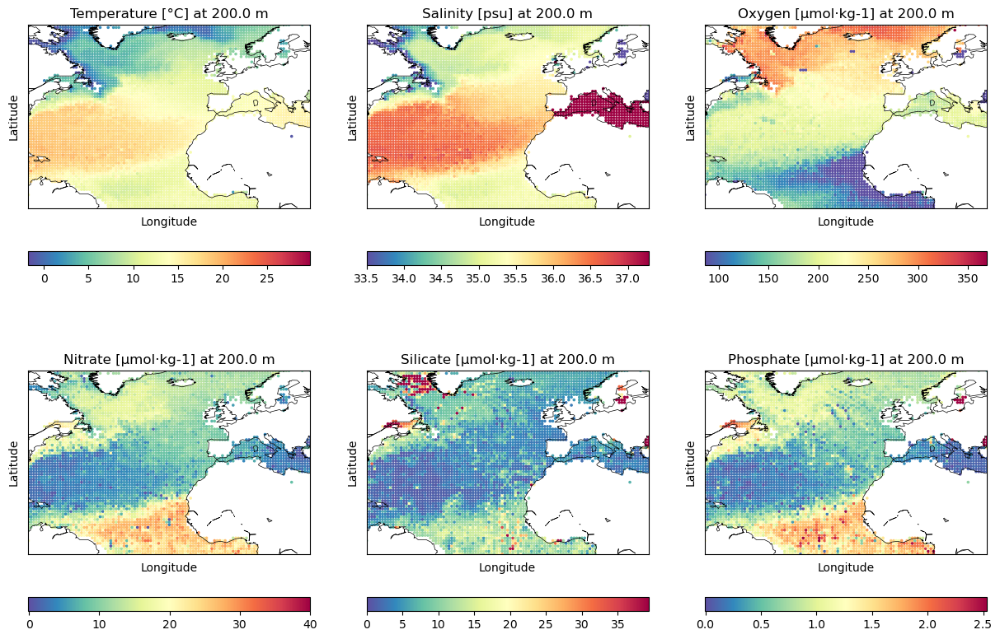

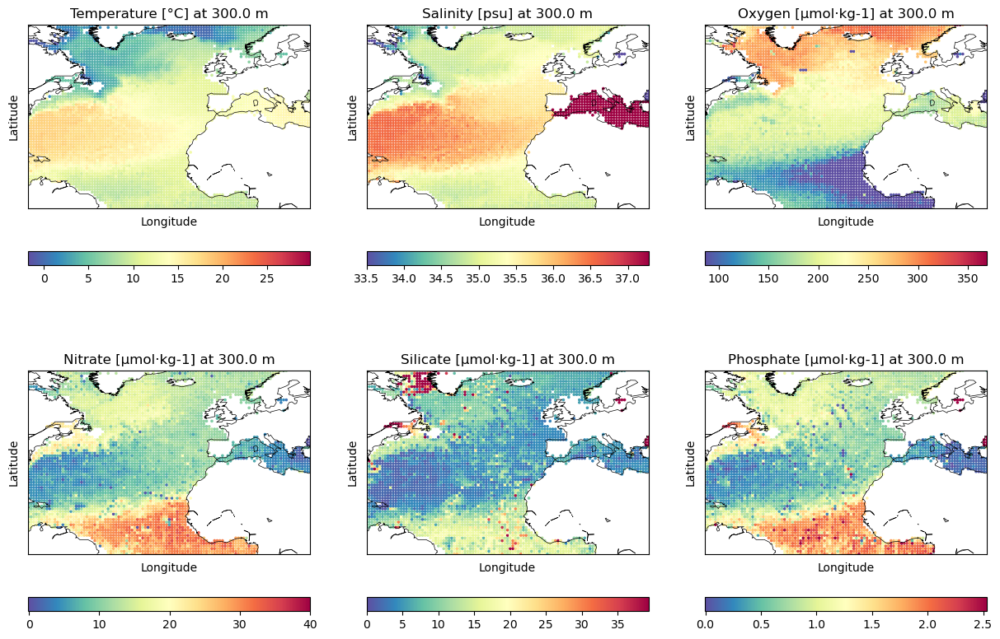

...

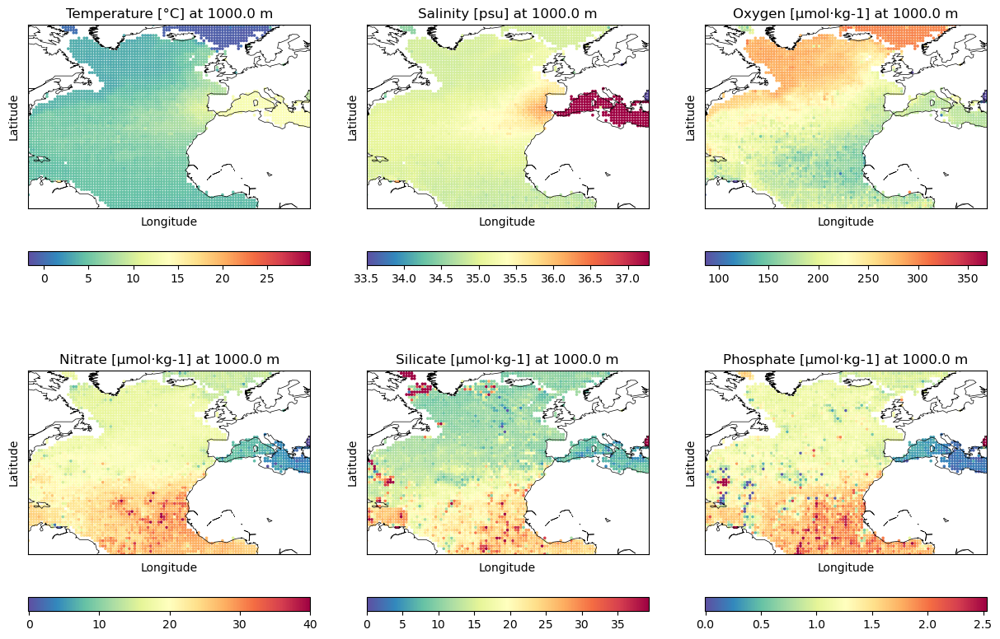

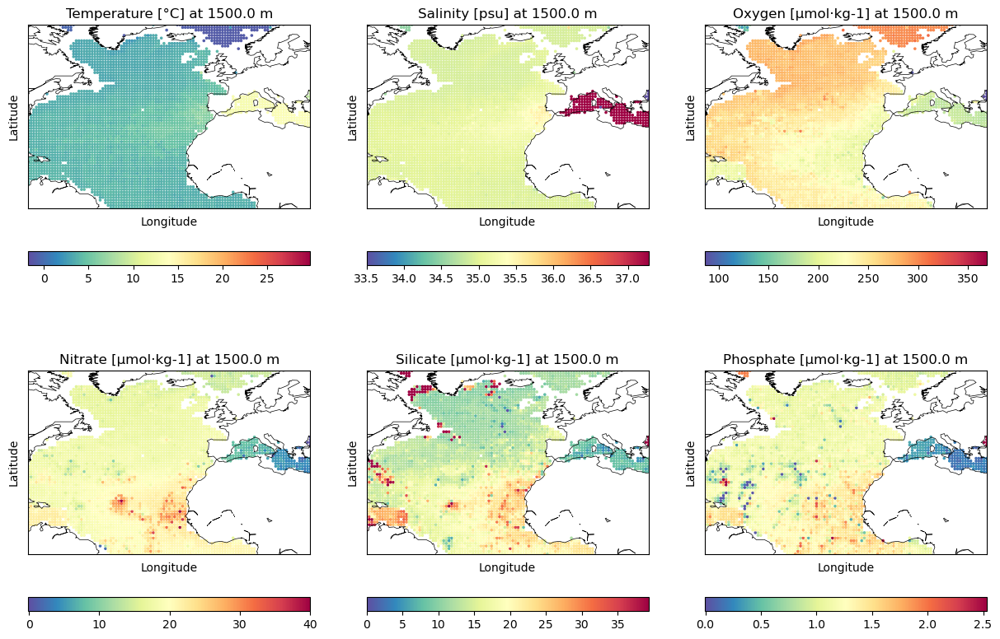

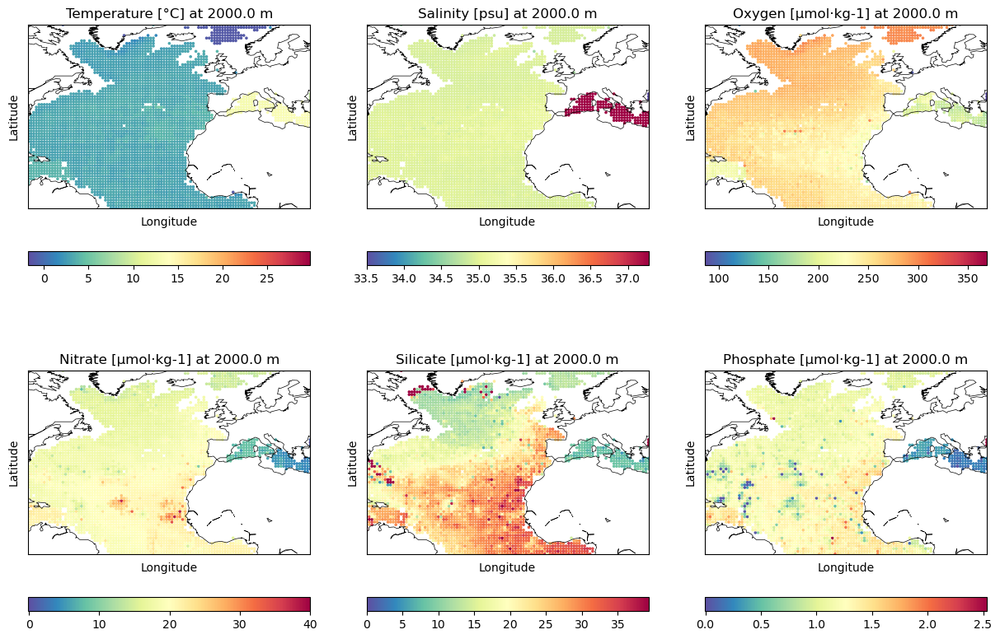

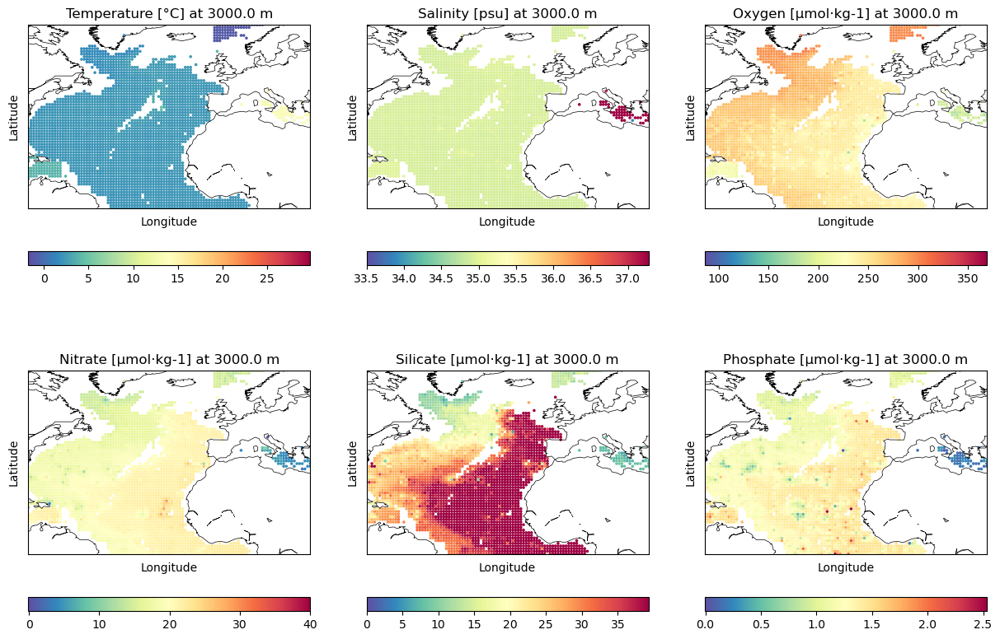

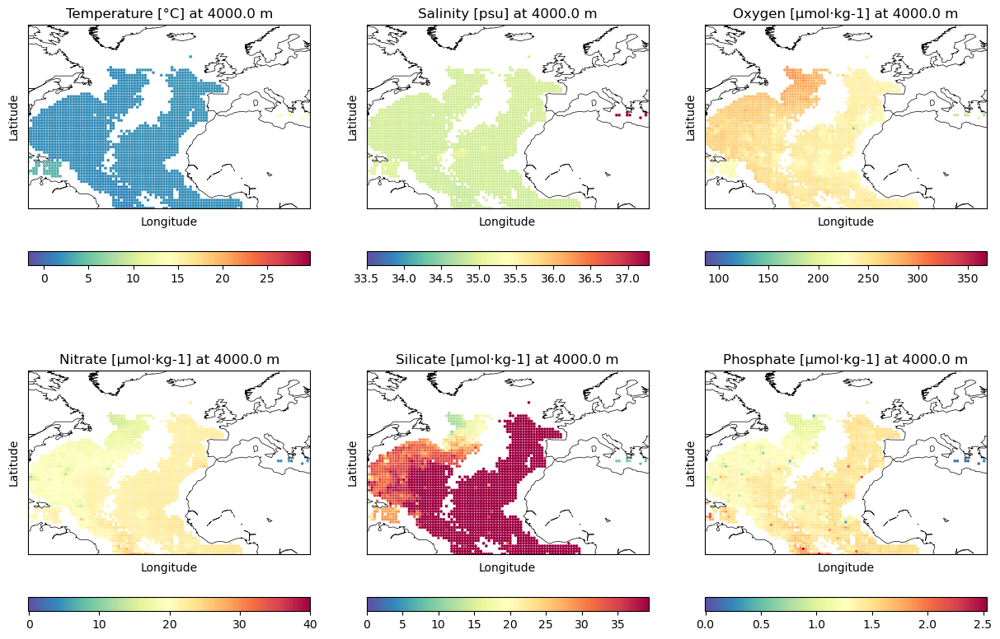

In [13]:
# Depth-layer-wise parameter inspection

# Show parameters in space
vmins = []
vmaxs = []

# Define basemap
extent = [df["LONGITUDE"].min(), df["LONGITUDE"].max(), df["LATITUDE"].min(), df["LATITUDE"].max()]

cmap = mpl.colormaps["Spectral_r"]

for depth in df.LEV_M.unique():
    temp = df[df.LEV_M == depth]
    
    fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(15, 10))
    axs = axs.flatten()
    
    i = 0
    for param, unit in zip(parameters, units): 
        q1, q3 = np.percentile(df[param], [25, 75])
        iqr = q3-q1
        vmin =max(q1-1.5*iqr, df[param].min())
        vmax =min(q3+1.5*iqr, df[param].max())
    
        bm = Basemap(llcrnrlon=extent[0], llcrnrlat=extent[2], urcrnrlon=extent[1], urcrnrlat=extent[3], ax=axs[i])
    
        sc = axs[i].scatter(temp["LONGITUDE"], temp["LATITUDE"], c=temp[param], s=10, marker=".", cmap=cmap, vmin=vmin, vmax=vmax)
        bm.drawcoastlines(linewidth=0.5)
        axs[i].set_xlabel("Longitude")
        axs[i].set_ylabel("Latitude")
        axs[i].set_title(f"{param[2:].capitalize()} [{unit}] at {depth} m")
        fig.colorbar(sc, ax=axs[i], location="bottom")
        i = i + 1
    plt.savefig(output_dir + f"3d_{depth}m.png")
    plt.show()

## Correlations

In [22]:
# Compute correlations
temp = df[parameters].rename(columns=parameter_name_map)
corr = temp.corr()
corr = pd.melt(corr.reset_index(), id_vars='index') # Unpivot the dataframe, so we can get pair of arrays for x and y
corr.columns = ['x', 'y', 'value']

# Indexes for display
idxs = [0, 6, 12, 18, 24, 30,
       10, 16, 22, 28, 34,
       7, 13, 19, 31,
       17, 23, 35,
       14, 20,
       21]

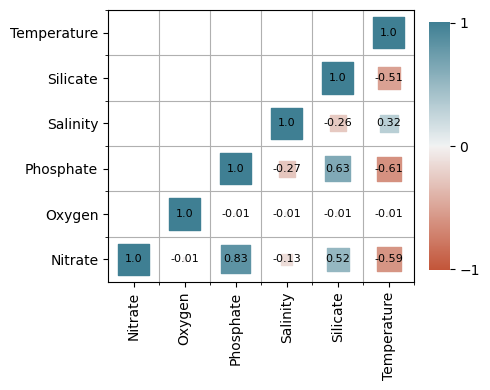

In [23]:
# Adapted from https://towardsdatascience.com/better-heatmaps-and-correlation-matrix-plots-in-python-41445d0f2bec
def heatmap(x, y, size, color_values, figsize=(5, 4), idxs_to_show=None):
    fig, axs = plt.subplots(1, 2, figsize=figsize, gridspec_kw={'width_ratios': [15, 1]})
    ax = axs[0]
    # Mapping from column names to integer coordinates
    x_labels = [v for v in sorted(x.unique())]
    y_labels = [v for v in sorted(y.unique())]
    x_to_num = {p[1]:p[0] for p in enumerate(x_labels)} 
    y_to_num = {p[1]:p[0] for p in enumerate(y_labels)} 

    def value_to_color(val):
        val_position = float((val - color_min)) / (color_max - color_min) # Position of value in the input range, relative to the length of the input range
        ind = int(val_position * (n_colors - 1)) # Target index in the color palette
        return palette[ind]

    size_scale = 500
    n_colors = 256 # Use 256 colors for the diverging color palette
    palette = sns.diverging_palette(20, 220, n=n_colors) # Create the palette
    color_min, color_max = [-1, 1] # Range of values that will be mapped to the palette, i.e. min and max possible correlation
    color = color_values.apply(value_to_color)

    if idxs_to_show:
        size = np.array(size)
        for i in range(len(size)):
            if i not in idxs_to_show:
                size[i] = np.nan
    
    sc = ax.scatter(
        x=x.map(x_to_num), # Use mapping for x
        y=y.map(y_to_num), # Use mapping for y
        s=size * size_scale, # Vector of square sizes, proportional to size parameter
        c=color, # Vector of square color values, mapped to color palette
        marker='s', # Use square as scatterplot marker
        label=color_values
    )

    # adding annotations to each entry
    for i in range(len(color)):
        if idxs_to_show:
            if i in idxs_to_show:
                ax.annotate(str(round(color_values[i], 2)), (x_to_num[x[i]], y_to_num[y[i]]), ha='center', va='center', fontsize=8)
        else:
            ax.annotate(str(round(color_values[i], 2)), (x_to_num[x[i]], y_to_num[y[i]]), ha='center', va='center', fontsize=8)
    
    # Show column labels on the axes
    ax.set_xticks([x_to_num[v] for v in x_labels], fontsize=8)
    ax.set_xticklabels(x_labels, rotation=90, horizontalalignment='center')
    ax.set_yticks([y_to_num[v] for v in y_labels], fontsize=8)
    ax.set_yticklabels(y_labels)

    # center points in grid cells
    ax.grid(False, 'major')
    ax.grid(True, 'minor')
    ax.set_xticks([t + 0.5 for t in ax.get_xticks()], minor=True)
    ax.set_yticks([t + 0.5 for t in ax.get_yticks()], minor=True)
    ax.set_xlim([-0.5, max([v for v in x_to_num.values()]) + 0.5]) 
    ax.set_ylim([-0.5, max([v for v in y_to_num.values()]) + 0.5])

    # Add color legend on the right side of the plot
    ax = axs[1]
    
    col_x = [0]*len(palette) # Fixed x coordinate for the bars
    bar_y=np.linspace(color_min, color_max, n_colors) # y coordinates for each of the n_colors bars
    
    bar_height = bar_y[1] - bar_y[0]
    ax.barh(
        y=bar_y,
        width=[5]*len(palette), # Make bars 5 units wide
        left=col_x, # Make bars start at 0
        height=bar_height,
        color=palette,
        linewidth=0
    )
    ax.set_xlim(1, 2) # Bars are going from 0 to 5, so lets crop the plot somewhere in the middle
    ax.grid(False) # Hide grid
    ax.set_facecolor('white') # Make background white
    ax.set_xticks([]) # Remove horizontal ticks
    ax.set_yticks(np.linspace(min(bar_y), max(bar_y), 3), fontsize=8) # Show vertical ticks for min, middle and max
    ax.yaxis.tick_right() # Show vertical ticks on the right 
    plt.box(False)
    
heatmap(
    x=corr['x'],
    y=corr['y'],
    size=corr['value'].abs(),
    color_values=corr['value'],
    idxs_to_show=idxs,
    figsize=(5, 4)
)

plt.tight_layout()
# plt.savefig(output_dir + "correlations_new.png")
plt.savefig(f"{output_dir_high_res}/correlations.png", dpi=1000)
plt.show()

ValueError: Contour levels must be increasing

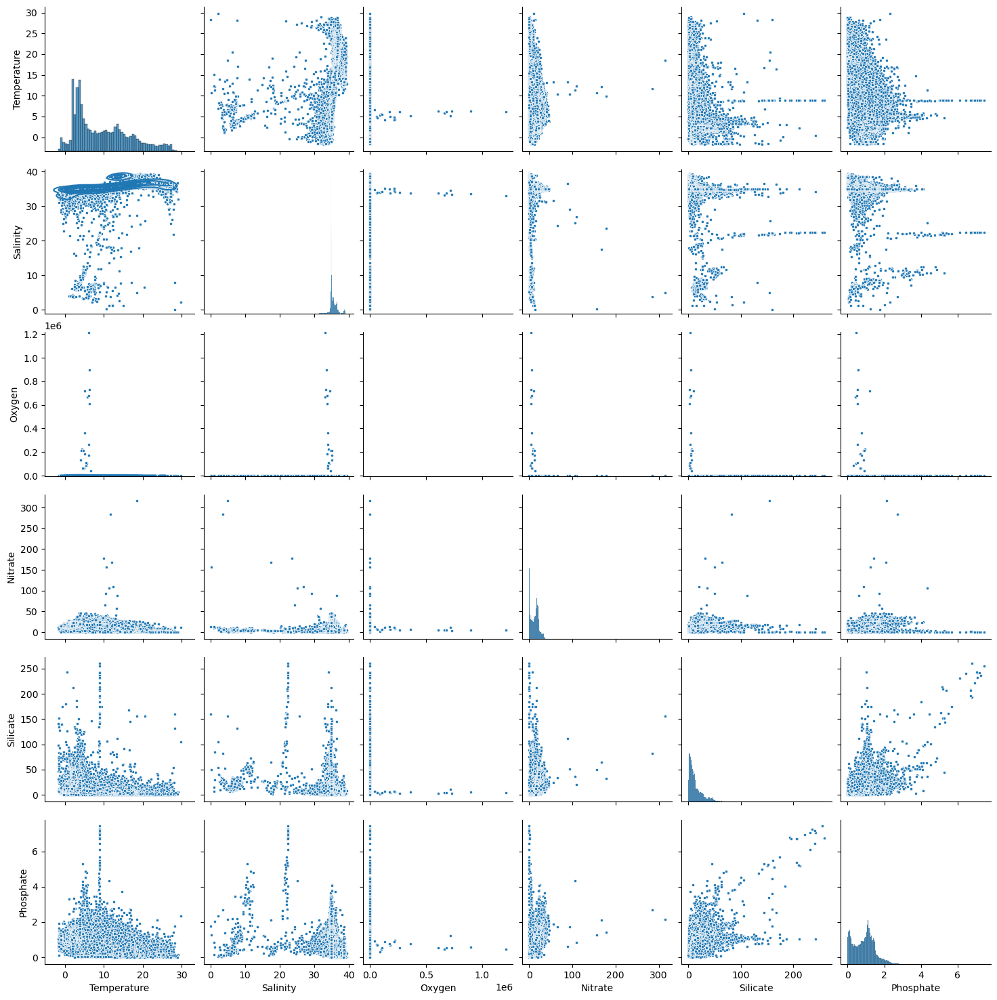

In [24]:
p = sns.pairplot(temp, plot_kws=dict(marker="."))
p.map_lower(sns.kdeplot)
plt.tight_layout()
plt.savefig(output_dir + "pairplot.png")
plt.show()